# Model results
Get predictions on test set from various segmentation approaches --- NDWI, XGBoost and U-NET

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
from train_landsat_unet import * #load dataset and model classes
import xgboost as xgb

import importlib
import evaluation as eval
import utils
importlib.reload(utils)
importlib.reload(eval)

base_path = '../data/'

/Users/conorosullivan/opt/miniconda3/envs/pytorch/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [38]:
# Load test images

test_path = base_path + 'test/'
test_paths = glob.glob(test_path + '*.npy')
print(len(test_paths))

test_mask = []
test_edge = []

for path in test_paths:
    test = np.load(path)

    test_mask.append(test[:,:,9])
    test_edge.append(test[:,:,10])

100


In [39]:
train_path = "../data/training/" #UPDATE
paths = glob.glob(train_path + "*")
random.seed(42)
random.shuffle(paths)

# Create a datasets for training and validation
split = int(0.9 * len(paths))
train_paths = paths[:split]
valid_paths = paths[split:]

In [3]:
def quick_eval(mask,preds,show_preds=True):
    """Quick evaluation of model performance used as a sense check"""
    print("Evaluation metrics\n==================")
    metrics, arr = eval.eval_metrics(mask,preds)
    eval.display_metrics(metrics,arr,hist=False)

    print("\nWithin 10 pixels\n==================")
    ctarget,cpreds = eval.get_coastline_pixels(test_mask,preds)
    cmetrics, carr = eval.eval_metrics(ctarget,cpreds)
    eval.display_metrics(cmetrics, carr, hist=False)
    
    if show_preds:
        eval.show_preds(test_paths,preds,arr,n=5,show_edge=True)

# Method 1: NDWI thresholding

Text(0, 0.5, 'Mean NDWI')

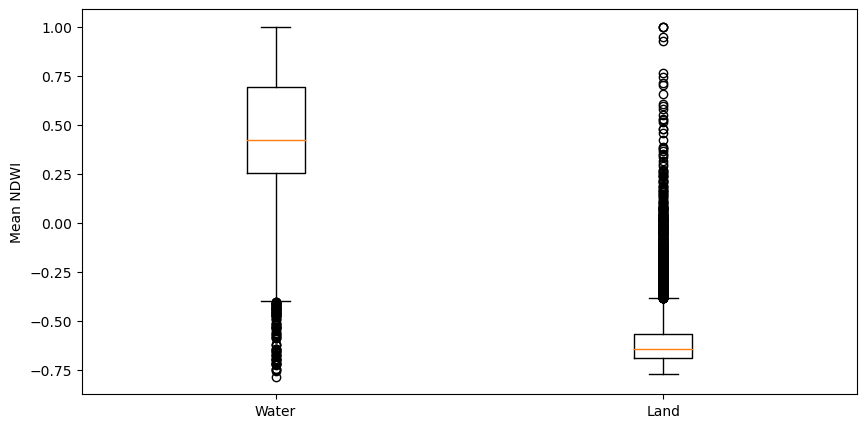

In [7]:
## Confirm that 0 is an appropirate NDWI threshold
water_means = []
land_means = []

for path in train_paths:
    img = np.load(path)

    mask = img[:,:,7]
    index = utils.get_index(img)

    water = index[mask==1]
    land = index[mask==0]

    if len(water) > 0: 
        water_mean = np.mean(water)
        if str(water_mean) != 'nan':
            water_means.append(water_mean)

    if len(land) > 0:
        land_mean = np.mean(land)
        if str(land_mean) != 'nan':
            land_means.append(land_mean)

# Plot boxplots of mean NDWI for water and land
plt.figure(figsize=(10,5))
plt.boxplot([water_means,land_means],labels=["Water","Land"])
plt.ylabel("Mean NDWI")

In [40]:
def get_threshold(index,threshold):
    """Get NDWI threshold predcition"""
    img = index.copy()
    """Threshold an image"""
    img[img >= threshold] = 1
    img[img < threshold] = 0
    return img

In [41]:
preds_ndwi = []

# Get predictions on test set
for path in test_paths:
    test = np.load(path)
    index = utils.get_index(test) #NDWI 
    pred = get_threshold(index,0)
    preds_ndwi.append(pred)

accuracy: 97.2053
balanced_accuracy: 97.1077
precision: 99.4261
recall: 94.6444
f1: 96.7336
mse: 3.7727
fom: 71.8146


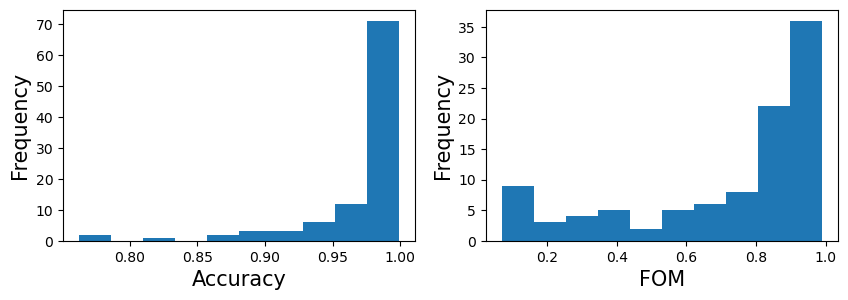

In [42]:
metrics_ndwi, arr_ndwi = eval.eval_metrics(test_mask,preds_ndwi)
eval.display_metrics(metrics_ndwi,arr_ndwi)

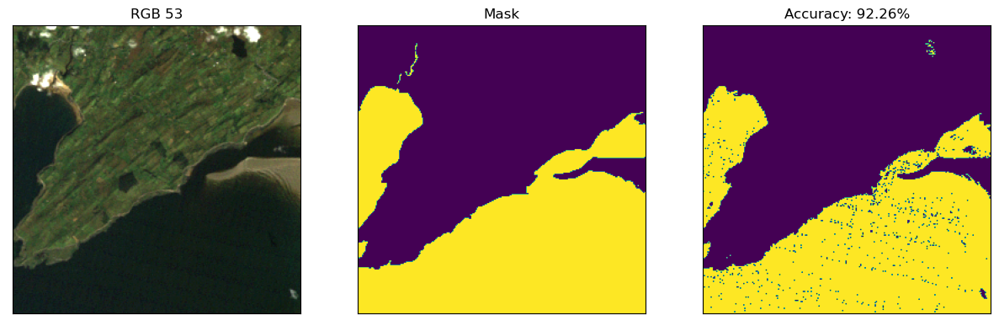

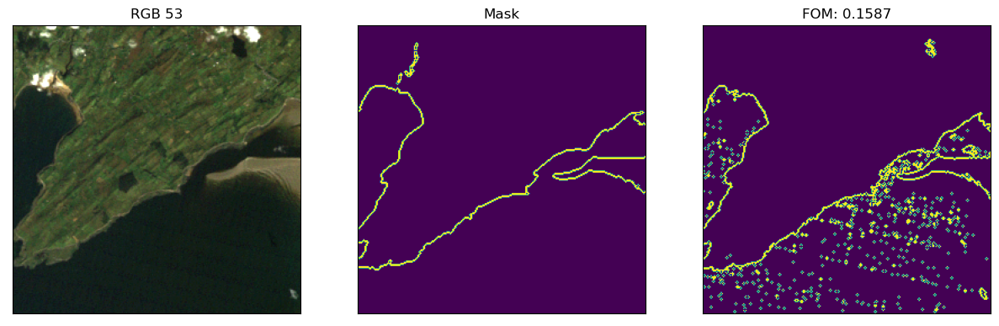

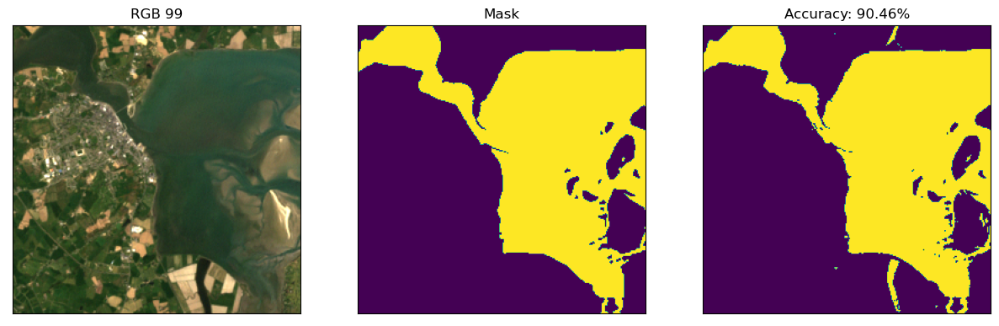

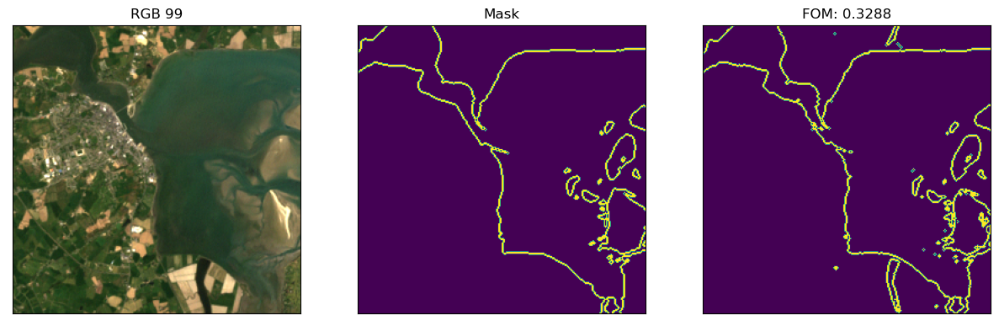

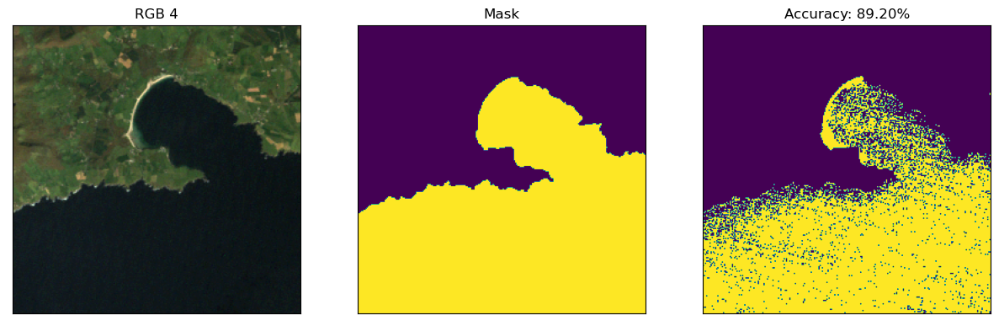

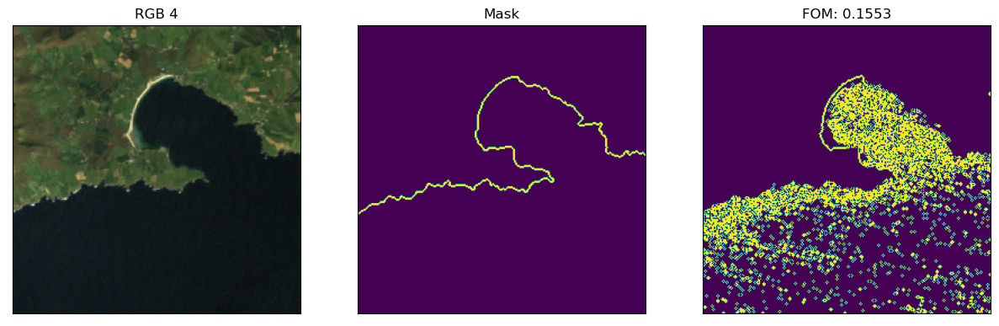

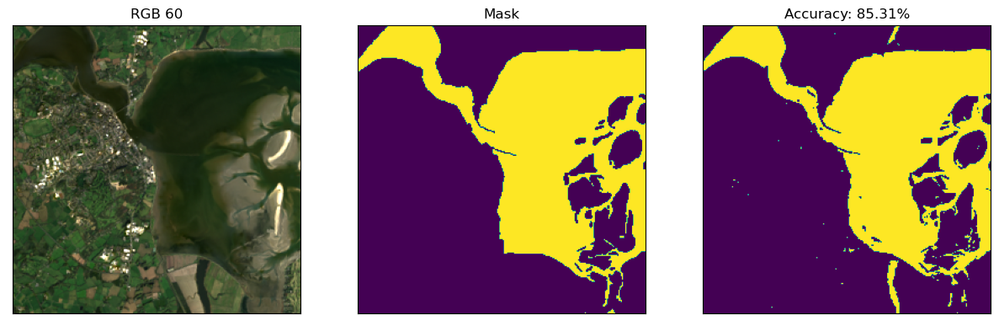

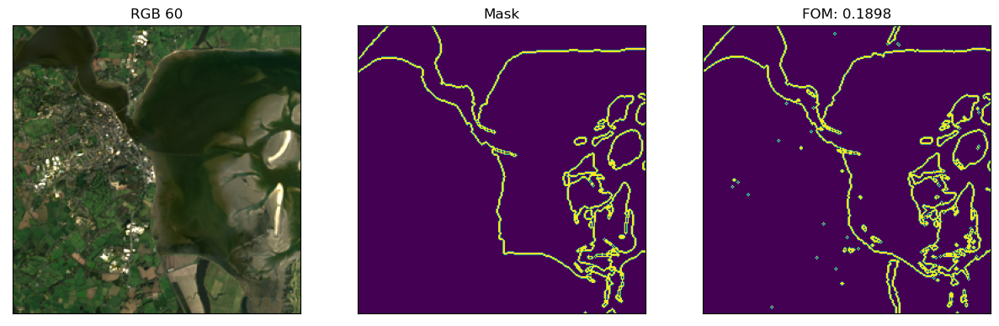

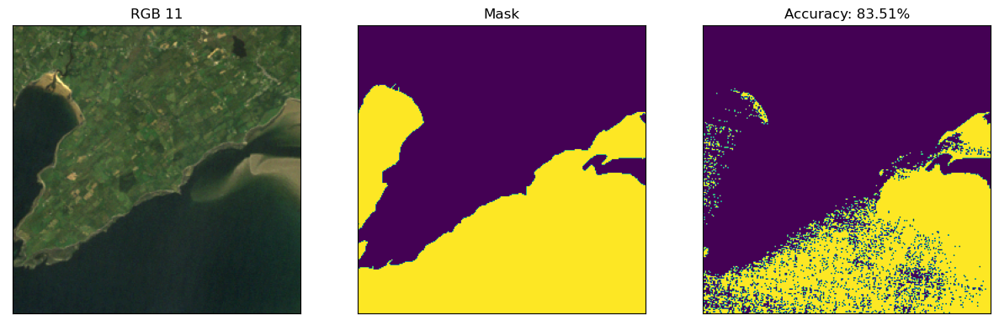

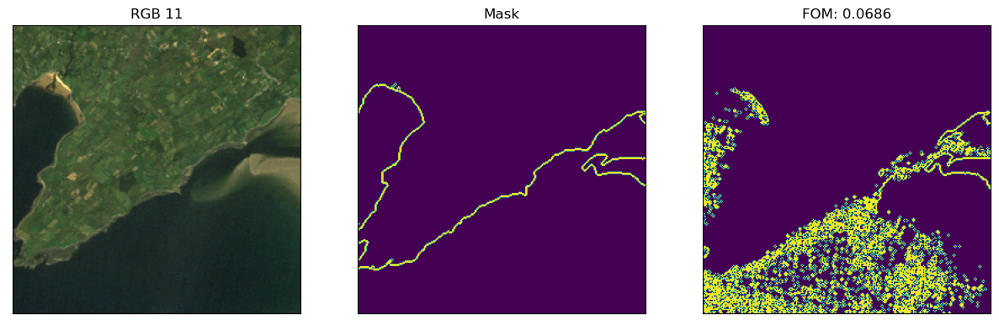

In [15]:
eval.show_preds(test_paths,preds_ndwi,arr_ndwi,n=5,show_edge=True)

accuracy: 93.7548
balanced_accuracy: 93.792
precision: 98.3383
recall: 89.0687
f1: 92.7279
mse: 2.0641
fom: 0.0687


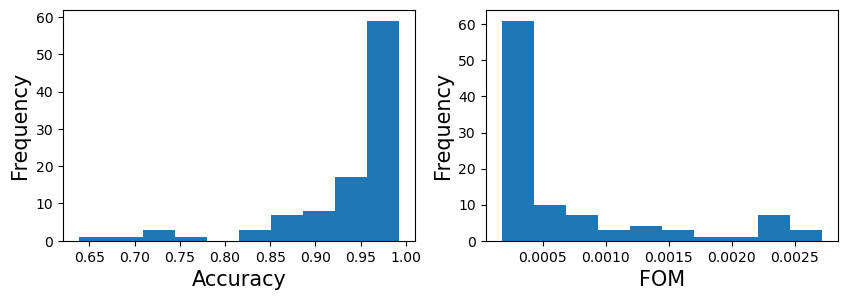

In [10]:
importlib.reload(eval)

ctarget,cpreds_ndwi = eval.get_coastline_pixels(test_mask,preds_ndwi)

cmetrics_ndwi, carr_ndwi = eval.eval_metrics(ctarget,cpreds_ndwi)
eval.display_metrics(cmetrics_ndwi, carr_ndwi)

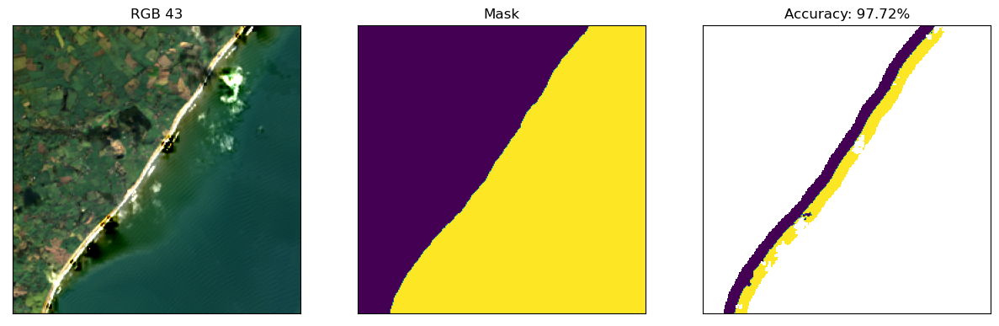

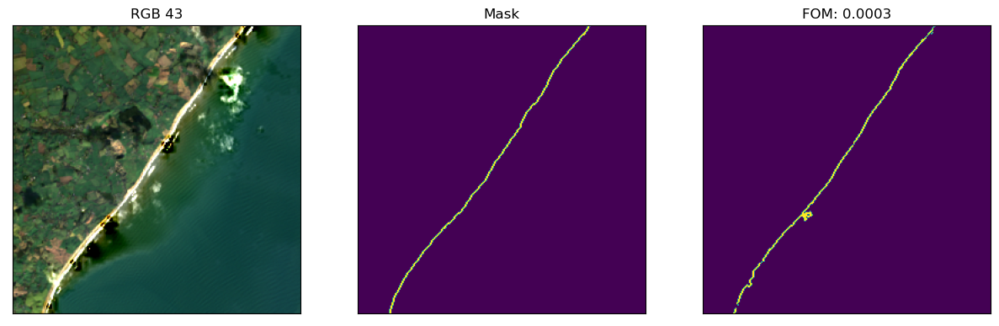

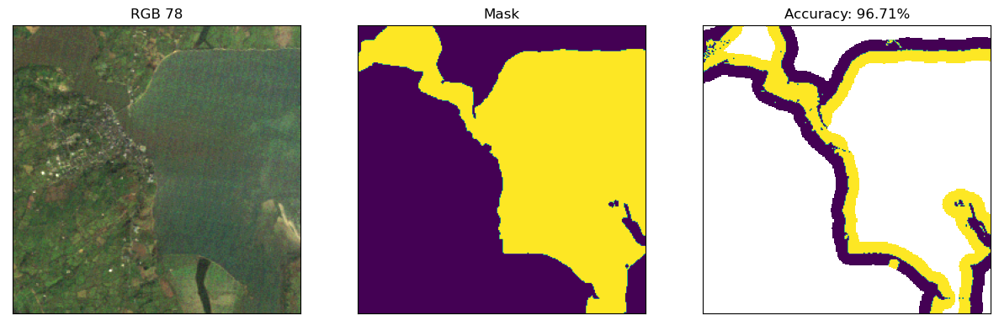

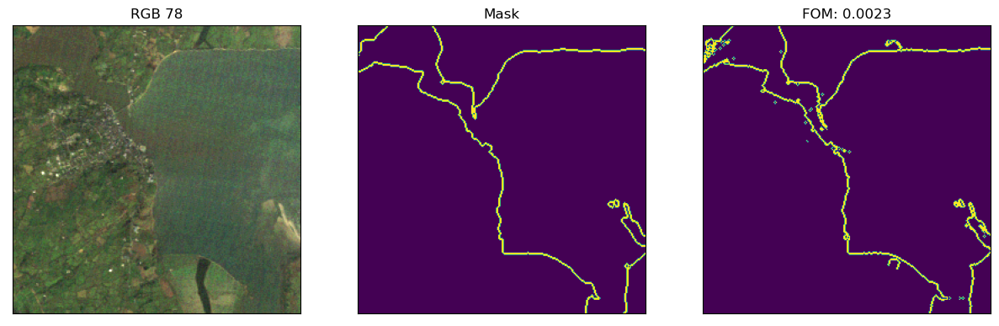

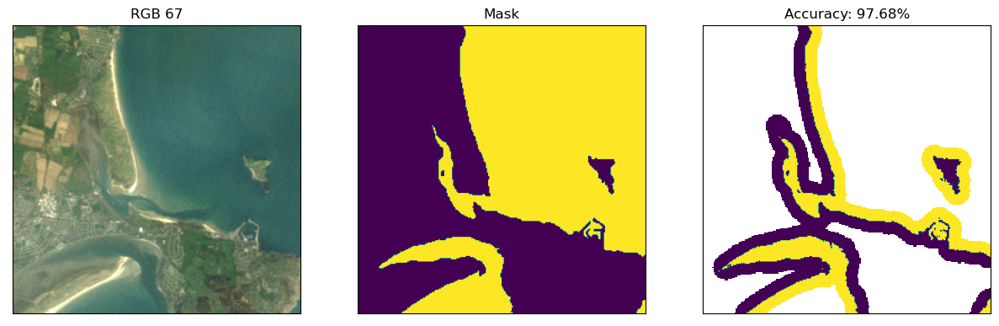

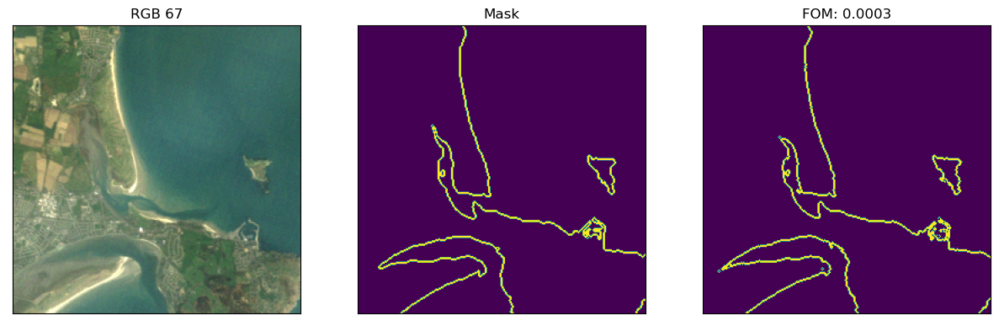

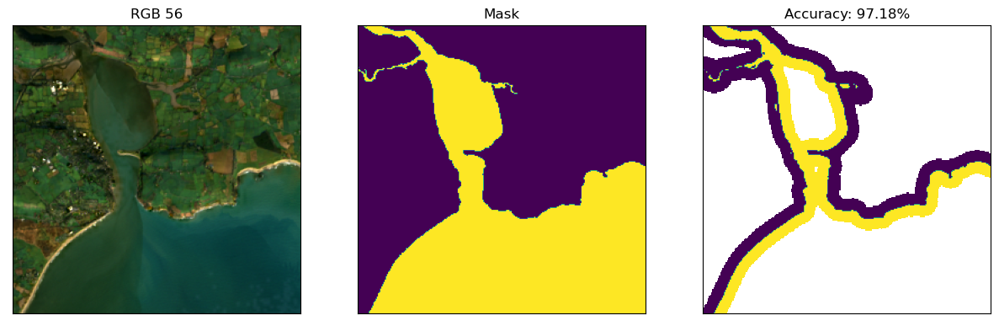

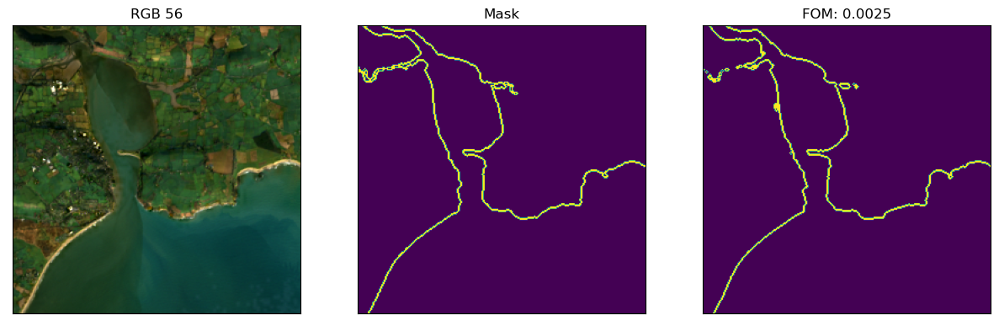

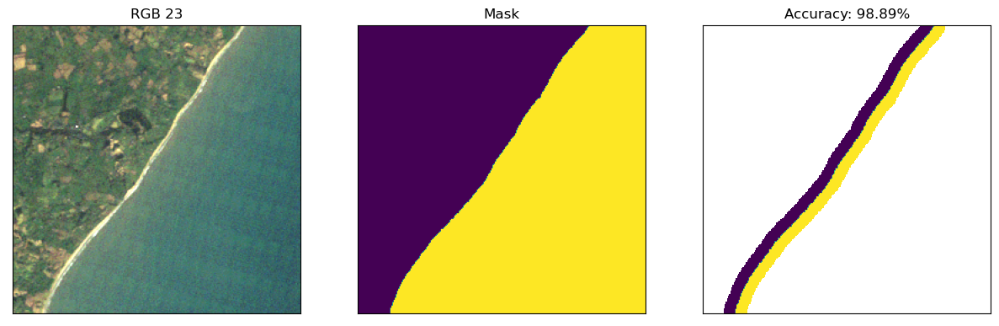

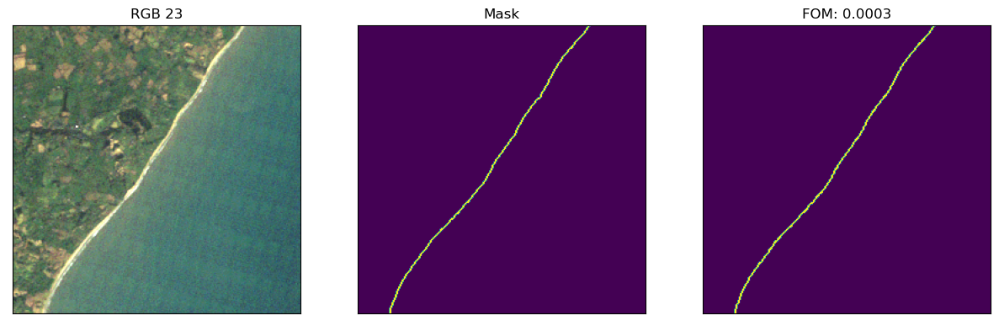

In [200]:
eval.show_preds(test_paths,cpreds_ndwi,carr_ndwi,n=5,show_edge=True)

# Method 2: canny edge detection
Note: this method was not included in the final paper

In [9]:
import skimage.feature as skif

def canny_ed(input, sigma = 1, threshold1=100, threshold2=200):

    """Get canny edge detection predcition"""
    img = input.copy()
    img = np.array(img)

    # scale between 0 and 1
    img = (img - np.min(img)) / (np.max(img) - np.min(img))
    
    edge = skif.canny(
    image=img,
    sigma=sigma,
    low_threshold=threshold1,
    high_threshold=threshold2,
    mode = 'nearest'
)
    return edge


In [10]:
def get_canny(paths,sigma,threshold):
    canny = []

    for path in paths:
        img = np.load(path)
        index = utils.get_index(test)
        pred = canny_ed(index,sigma,threshold[0],threshold[1])

        pred = pred.astype(np.uint8)
        canny.append(pred)

    return canny

In [21]:
sigma = [1,2,3,4,5]
thresholds = [(0.05,0.1),(0.1,0.2),(0.2,0.4)]

for s in sigma:
    for thresh in thresholds:
        pred_temp = get_canny(test_paths,s,thresh)

        metrics_temp, arr_temp = eval.eval_metrics(test_mask,pred_temp)
        mse = round(metrics_temp['mse'],4)
        fom = round(metrics_temp['fom'],4)

        print("{} {} MSE: {} FOM: {}".format(s,thresh,mse,fom))

1 (0.05, 0.1) MSE: 0.474 FOM: 0.0008
1 (0.1, 0.2) MSE: 0.3151 FOM: 0.0009
1 (0.2, 0.4) MSE: 0.2066 FOM: 0.0008
2 (0.05, 0.1) MSE: 0.2529 FOM: 0.0007
2 (0.1, 0.2) MSE: 0.1732 FOM: 0.0008
2 (0.2, 0.4) MSE: 0.0924 FOM: 0.0012
3 (0.05, 0.1) MSE: 0.1619 FOM: 0.0008
3 (0.1, 0.2) MSE: 0.1048 FOM: 0.001
3 (0.2, 0.4) MSE: 0.0624 FOM: 0.0013
4 (0.05, 0.1) MSE: 0.1187 FOM: 0.0009
4 (0.1, 0.2) MSE: 0.0707 FOM: 0.0011
4 (0.2, 0.4) MSE: 0.048 FOM: 0.0019
5 (0.05, 0.1) MSE: 0.0922 FOM: 0.0009
5 (0.1, 0.2) MSE: 0.0579 FOM: 0.0014


/Users/conorosullivan/Documents/git/COASTAL MONITORING/landsat-coastline-segmentation/src/evaluation.py:98: RuntimeWarning: invalid value encountered in double_scalars
  f1 = 2*(precision*recall)/(precision+recall)


5 (0.2, 0.4) MSE: 0.0292 FOM: 0.0001


In [11]:
preds_canny = []

for path in test_paths:
    test = np.load(path)
    index = utils.get_index(test)
    pred = canny_ed(index,5,0.1,0.2)

    pred = pred.astype(np.uint8)
    preds_canny.append(pred)

Evaluation metrics


/Users/conorosullivan/Documents/git/COASTAL MONITORING/landsat-coastline-segmentation/src/evaluation.py:96: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP_/(TP_+FP_)
/Users/conorosullivan/Documents/git/COASTAL MONITORING/landsat-coastline-segmentation/src/evaluation.py:98: RuntimeWarning: invalid value encountered in double_scalars
  f1 = 2*(precision*recall)/(precision+recall)


accuracy: 53.5587
balanced_accuracy: 50.0145
precision: nan
recall: 1.0987
f1: nan
mse: 2.8786
fom: 0.0628

Within 10 pixels
accuracy: 49.8378
balanced_accuracy: 49.4575
precision: nan
recall: 3.7558
f1: nan
mse: 2.7147
fom: 0.0631


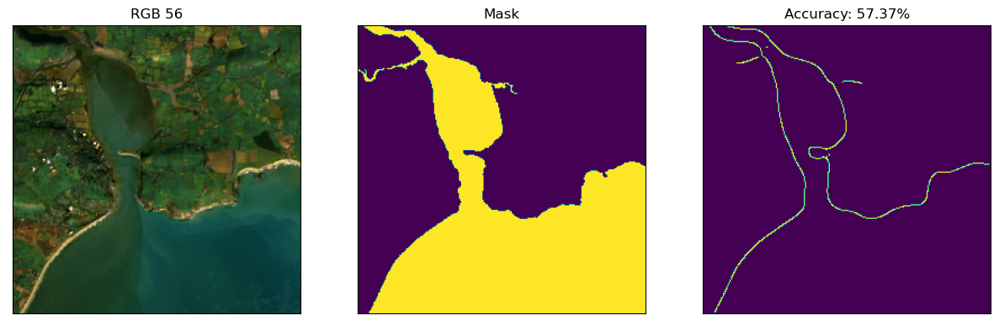

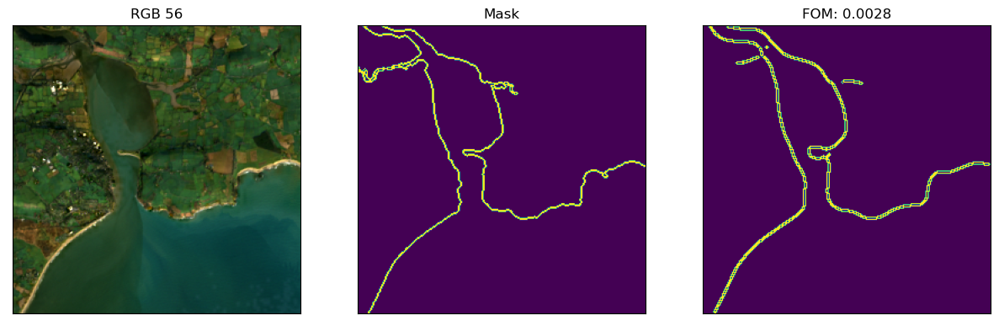

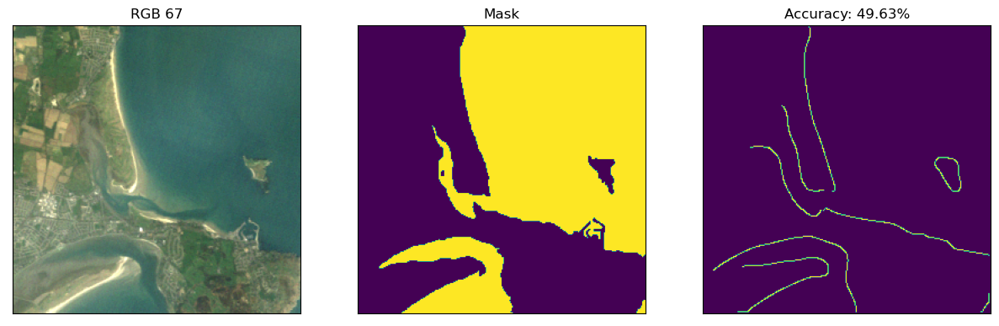

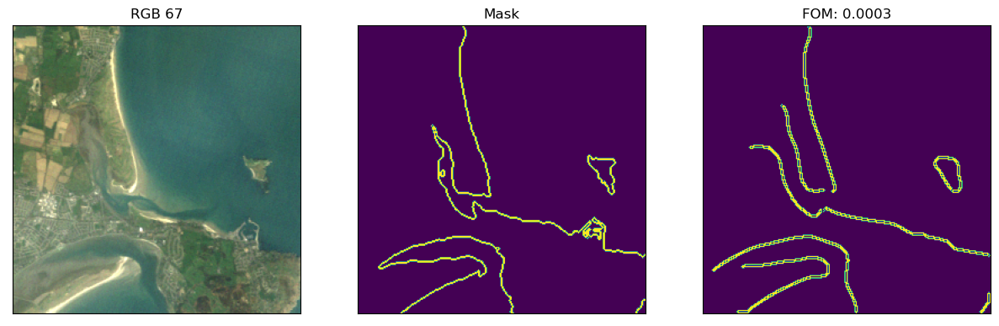

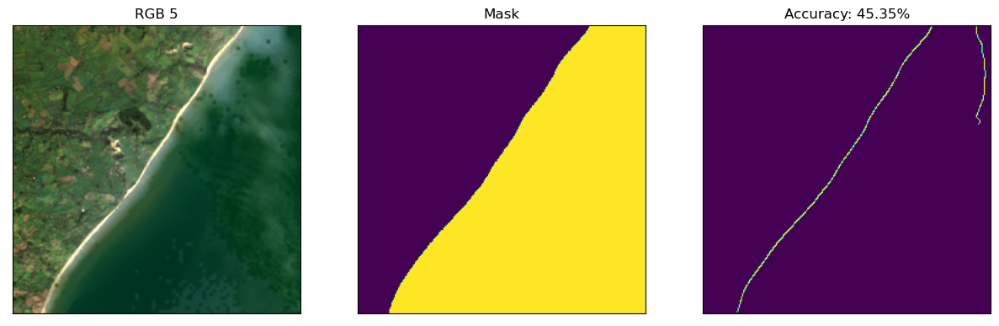

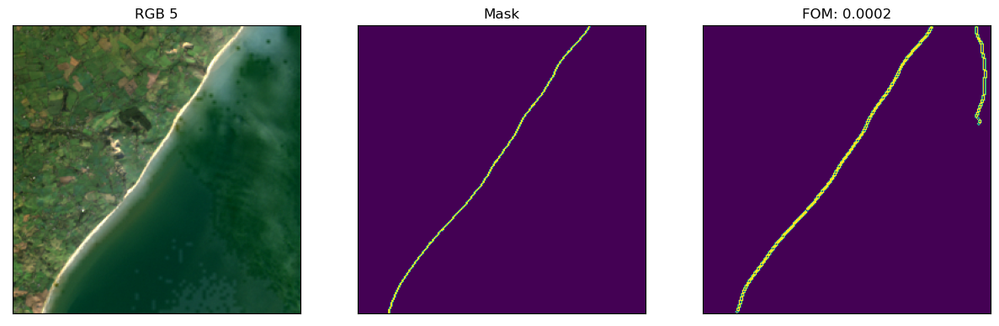

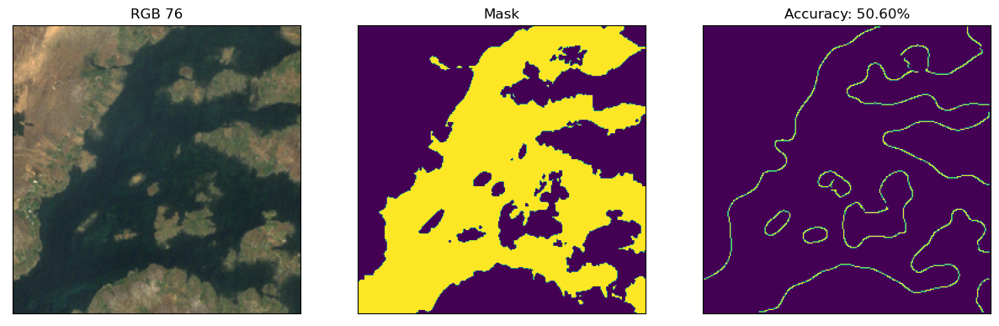

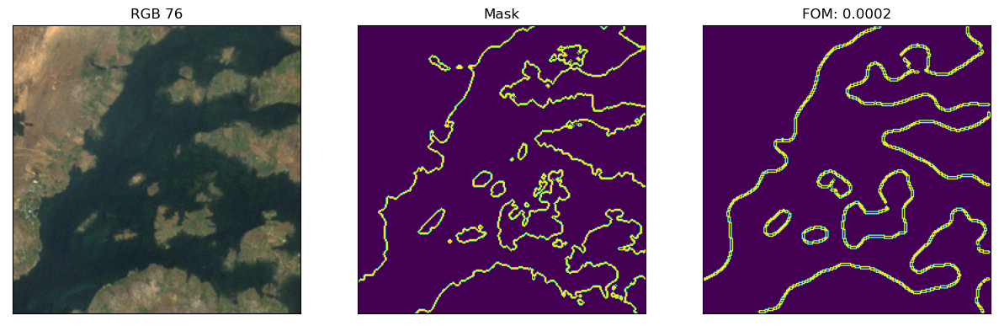

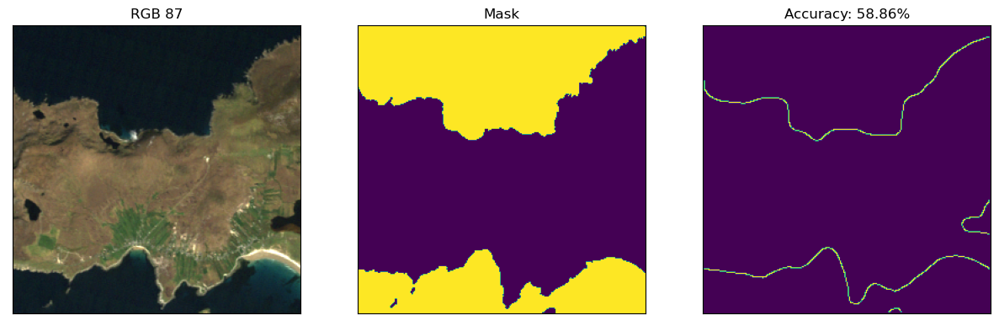

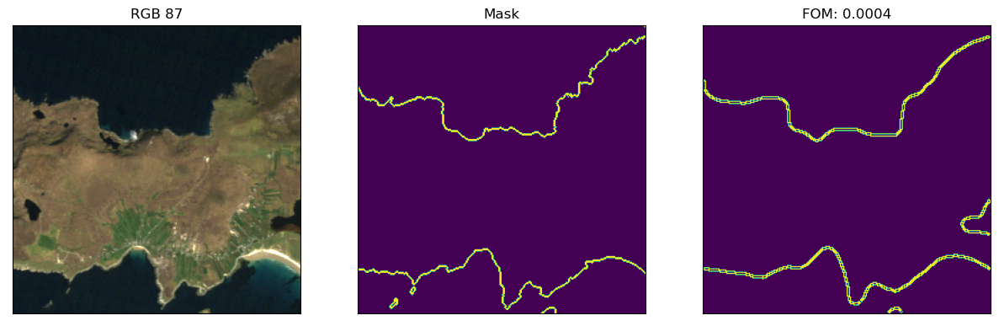

In [35]:
quick_eval(test_mask,preds_canny)

# Method 3: XGBoost

In [55]:
XG_train = []

for path in train_paths:
    instance = np.load(path)

    # select 100 random pixels from each image
    for i in range(1000):
        y = random.randint(0, instance.shape[0]-1)
        x = random.randint(0, instance.shape[1]-1)
        XG_train.append(instance[y,x,:])

XG_train_df = pd.DataFrame(XG_train, columns = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2', 'Thermal','Mask'])
print(XG_train_df.shape)

XG_valid = []

for path in valid_paths:
    instance = np.load(path)

    # select 100 random pixels from each image
    for i in range(100):
        y = random.randint(0, instance.shape[0]-1)
        x = random.randint(0, instance.shape[1]-1)
        XG_valid.append(instance[y,x,:])

XG_valid_df = pd.DataFrame(XG_valid, columns = ['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2', 'Thermal','Mask'])
print(XG_valid_df.shape)

XG_train_df.to_csv('../data/XG_train.csv', index=False)
XG_valid_df.to_csv('../data/XG_valid.csv', index=False)


(27000000, 8)
(300000, 8)


In [45]:
XG_train_df = pd.read_csv('../data/XG_train.csv')
XG_valid_df = pd.read_csv('../data/XG_valid.csv')

In [37]:
# Select optimal parameters
depths = [2,3,4]
n_estimators = [100,200,500]

X = XG_train_df.drop(columns=['Mask'])
y = XG_train_df['Mask']

X_valid = XG_valid_df.drop(columns=['Mask'])
y_valid = XG_valid_df['Mask']

for d in depths:
    for n in n_estimators:
        #Train model on all channels and indices
        model = xgb.XGBClassifier(objective="binary:logistic",max_depth=d,n_estimators=n, importance_type='gain')
        model.fit(X,y)

        preds = model.predict(X_valid)
        accuracy = np.sum(preds == y_valid) / len(preds)
        accuracy = round(accuracy,4)
        print("{} {}: {}".format(d,n,accuracy))

KeyboardInterrupt: 

In [56]:
X = XG_train_df.drop(columns=['Mask'])
y = XG_train_df['Mask']

X_valid = XG_valid_df.drop(columns=['Mask'])
y_valid = XG_valid_df['Mask']

d = 2
n = 500

model = xgb.XGBClassifier(objective="binary:logistic",max_depth=d,n_estimators=n)
model.fit(X,y)

preds = model.predict(X_valid)
accuracy = np.sum(preds == y_valid) / len(preds)
accuracy = round(accuracy,4)
print("{} {}: {}".format(d,n,accuracy))

2 500: 0.9901


In [57]:
def xgboost_pred_mask(test,model):

    """return predicted mask from model"""

    bands = test[:,:,0:7]

    bands = bands.ravel()
    bands = bands.reshape((-1, 7))

    preds = model.predict(np.array(bands))
    pred_mask = preds.reshape((test.shape[0],test.shape[1]))

    return pred_mask

In [58]:
preds_xgb = []

for path in test_paths:
    test = np.load(path)
    pred = xgboost_pred_mask(test,model)

    preds_xgb.append(pred)

Evaluation metrics


accuracy: 92.7188
balanced_accuracy: 92.1815
precision: 94.5194
recall: 87.9574
f1: 89.7217
mse: 8.5169
fom: 0.0721

Within 10 pixels
accuracy: 84.5443
balanced_accuracy: 84.8688
precision: 87.4618
recall: 81.6255
f1: 82.5215
mse: 4.0843
fom: 0.0684


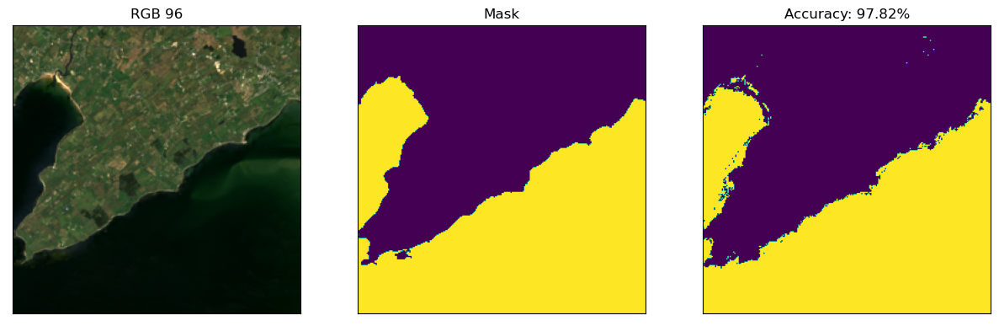

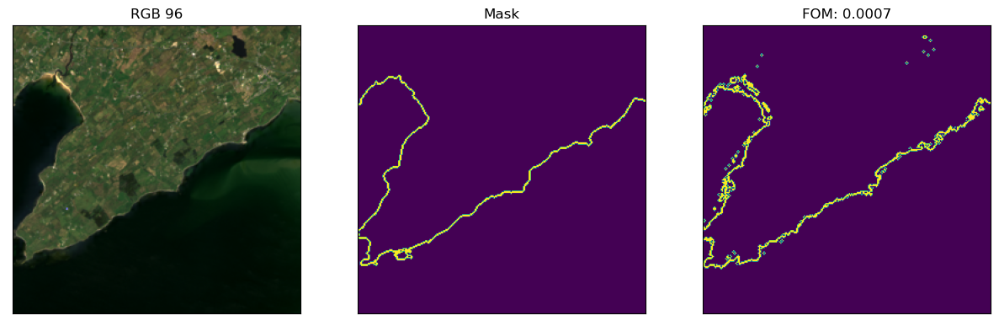

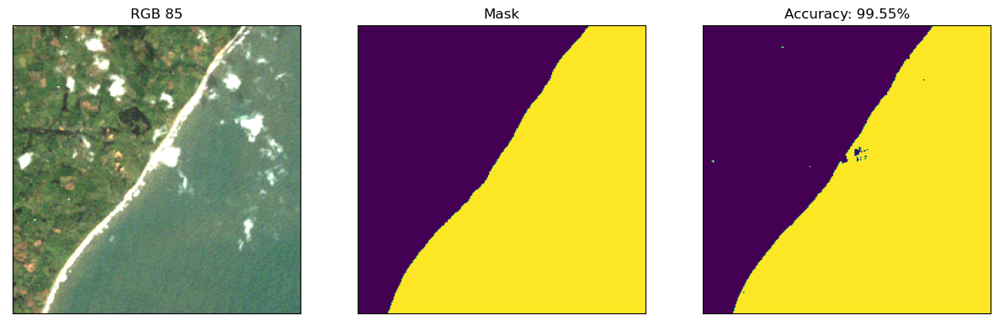

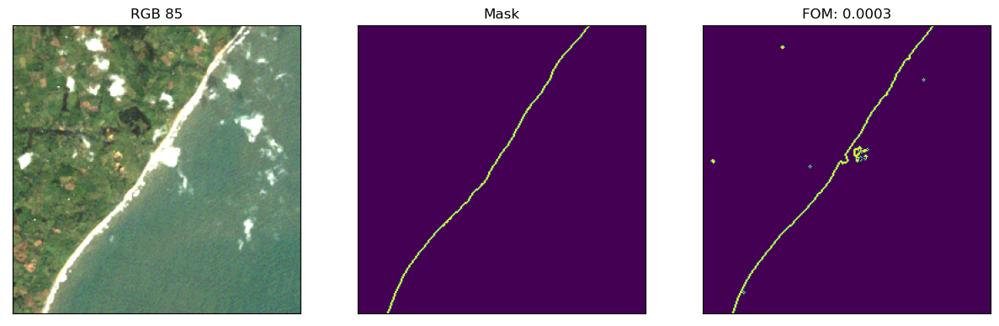

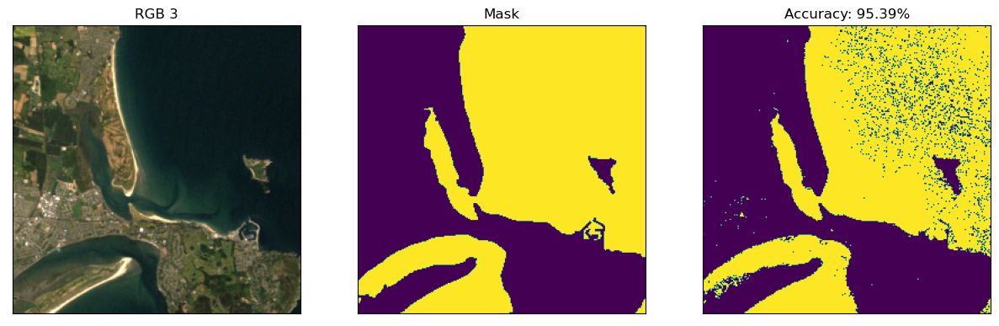

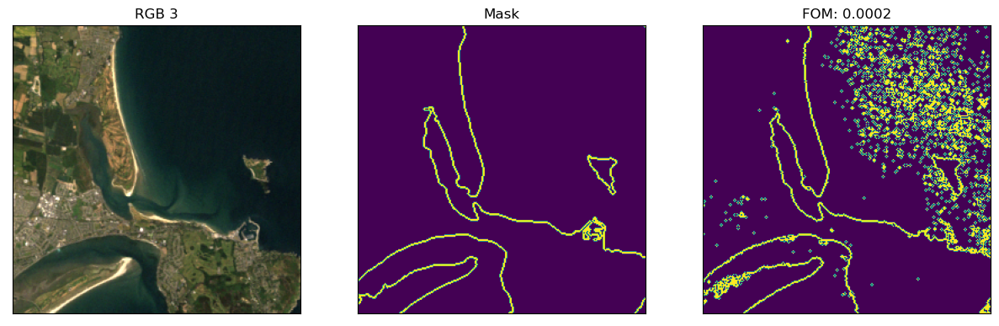

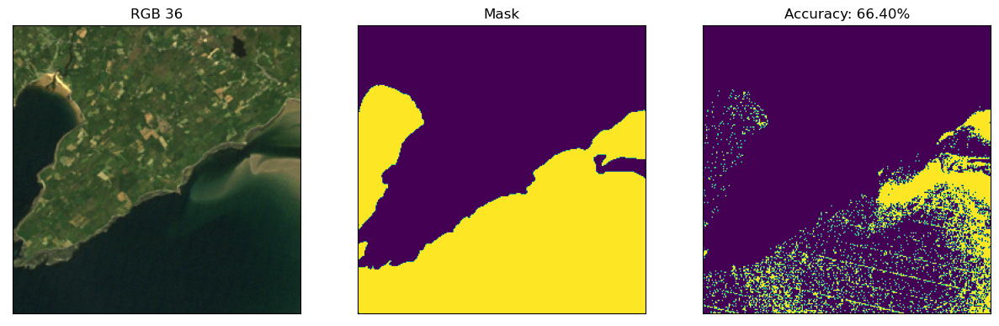

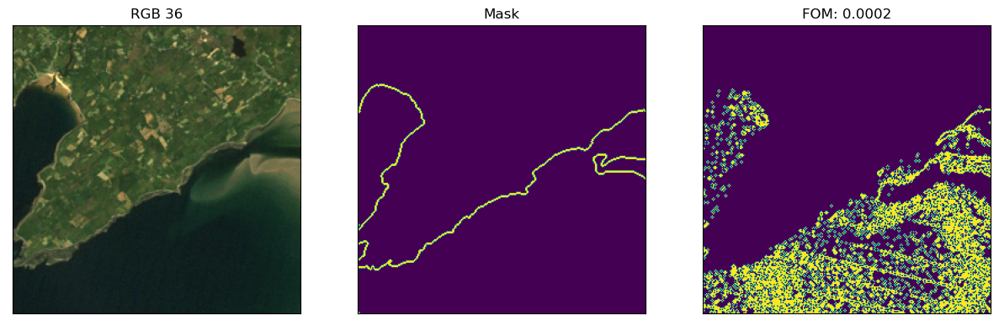

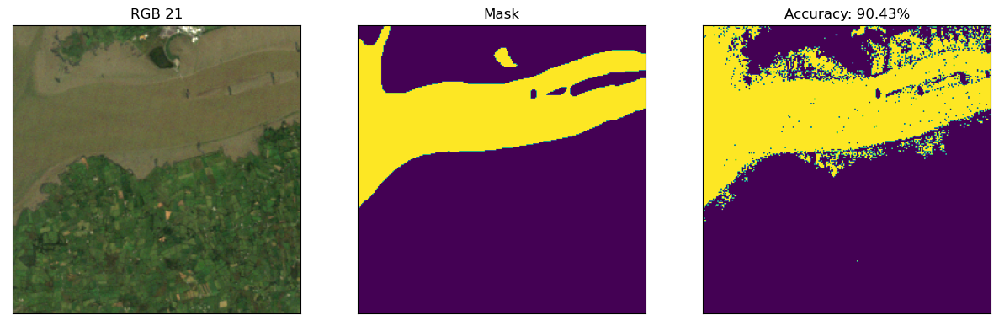

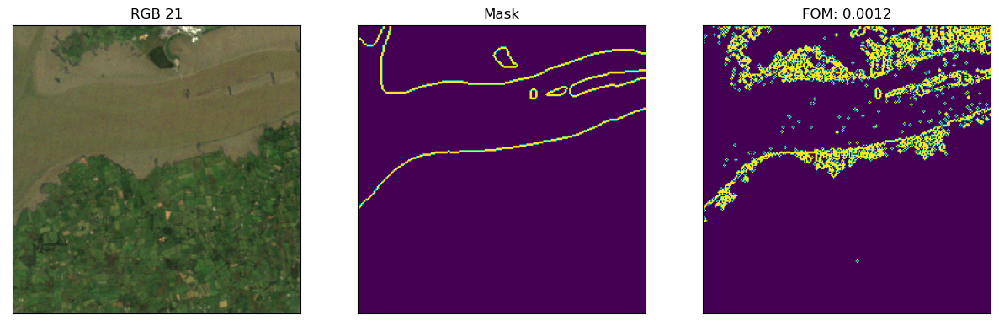

In [ ]:
quick_eval(test_mask,preds_xgb)

# Method 4: UNET

In [60]:
# Set device
device = torch.device('mps')  #UPDATE
print("Using device: {}\n".format(device))

# Load saved model 
#model = torch.load('../models/LANDSAT-UNET-20JUL23.pth', map_location=torch.device('cpu') )
model = torch.load('../models/LANDSAT-UNET2-21JUL23.pth', map_location=torch.device('cpu') )
model.eval()
model.to(device)

Using device: mps



U_Net(
  (Maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv1): conv_block(
    (conv): Sequential(
      (0): Conv2d(7, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (Conv2): conv_block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )

In [61]:
targets, preds_unet = eval.get_preds(model,test_paths,batch_size=10)
print(len(preds_unet))

100


Evaluation metrics
accuracy: 96.565
balanced_accuracy: 96.6428
precision: 96.3081
recall: 96.0286
f1: 95.9345
mse: 3.0674
fom: 0.0462

Within 10 pixels
accuracy: 87.6605
balanced_accuracy: 87.797
precision: 88.792
recall: 87.6858
f1: 87.2948
mse: 3.0043
fom: 0.0448


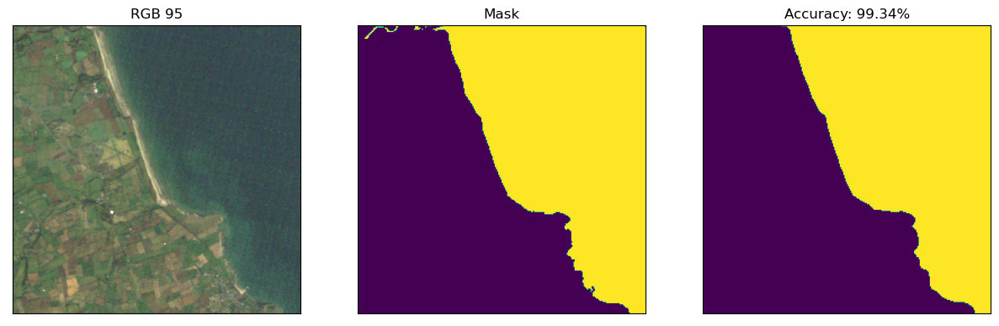

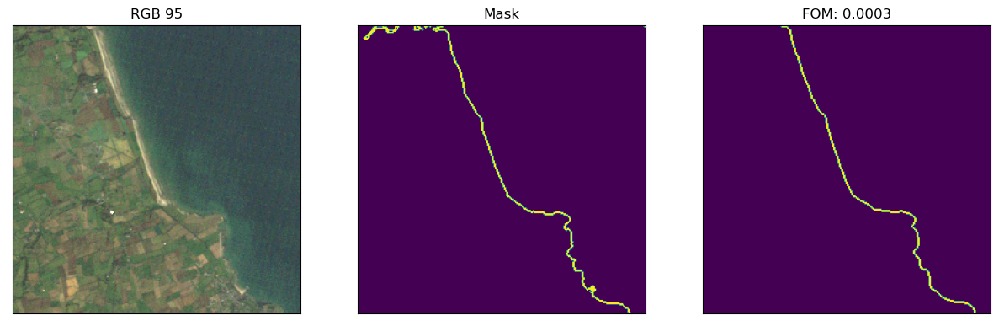

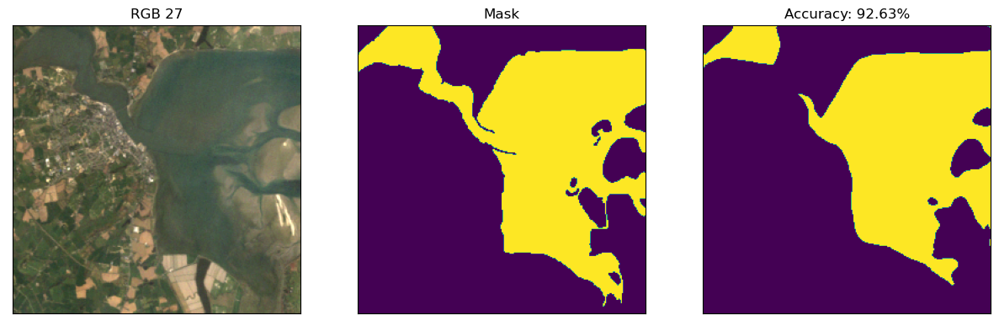

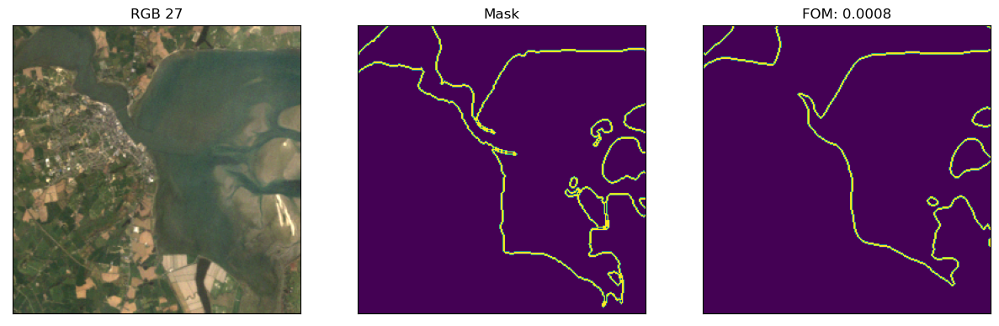

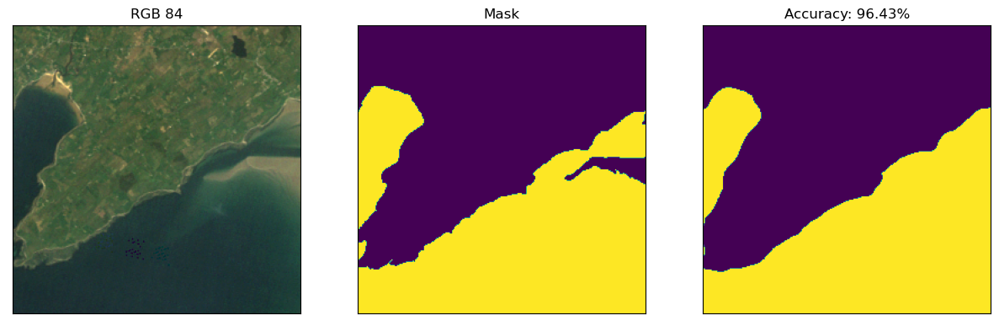

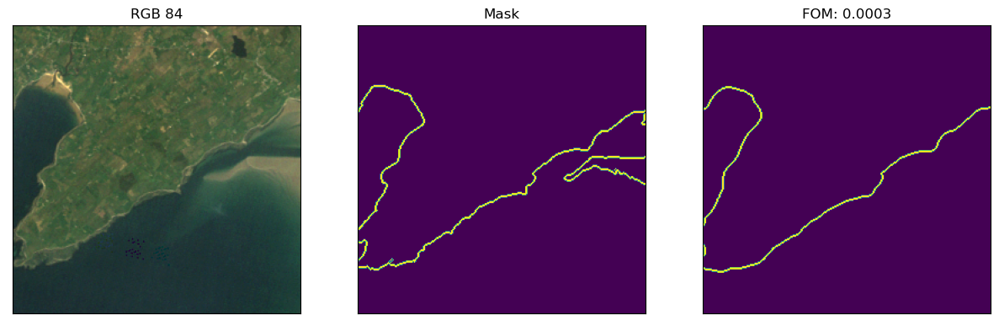

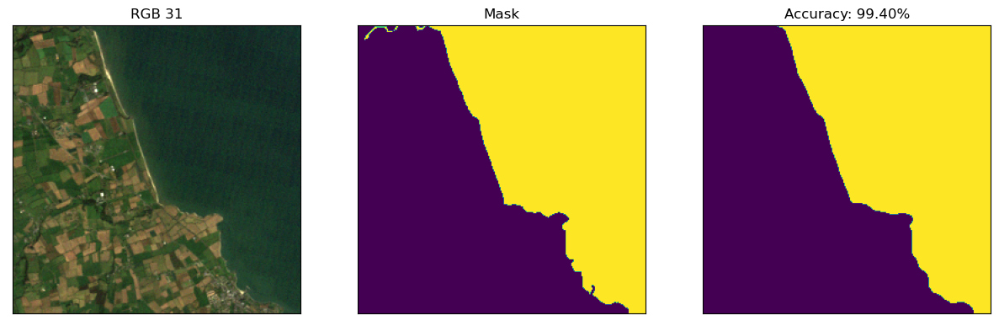

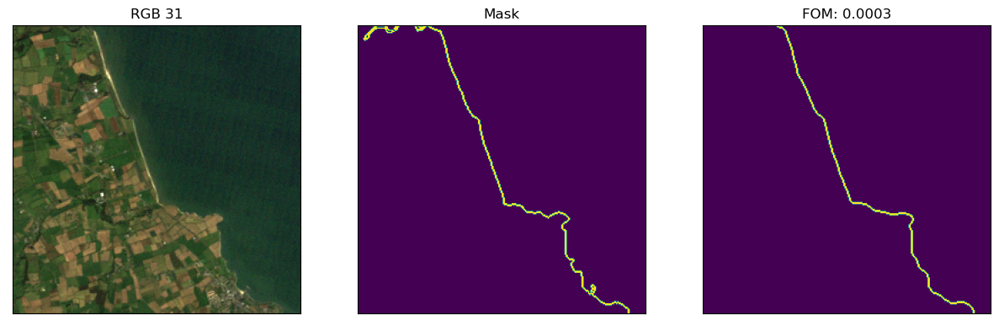

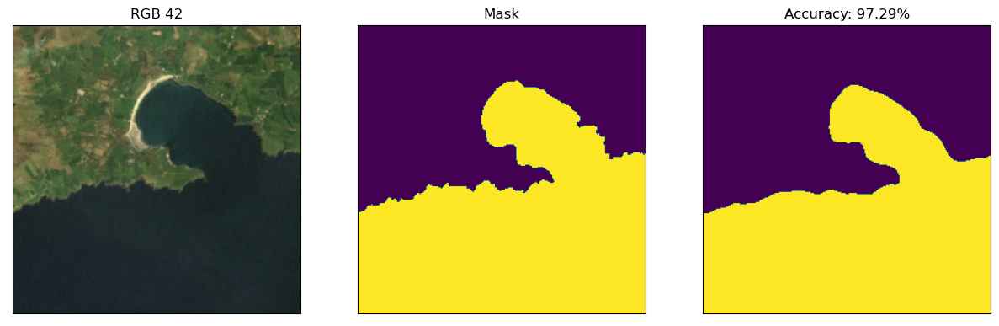

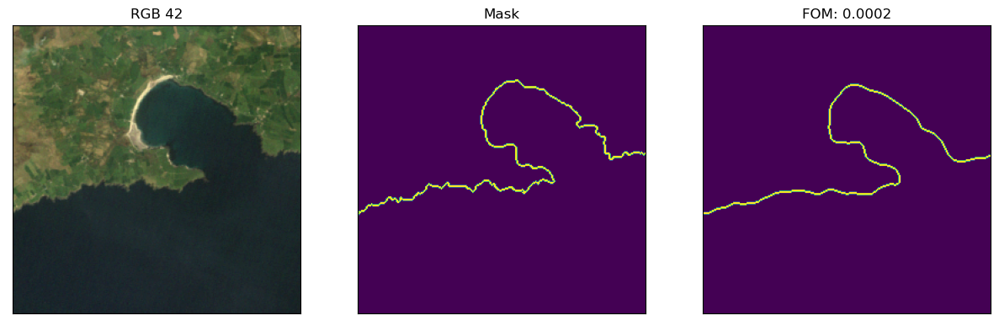

In [49]:
quick_eval(test_mask,preds_unet)

# Method 4: ATTUNET

In [18]:
# Set device
device = torch.device('mps')  #UPDATE
print("Using device: {}\n".format(device))

# Load saved model 
model = torch.load('../models/LANDSAT-ATTUNET-20JUL23.pth', map_location=torch.device('cpu') )
model.eval()
model.to(device)

Using device: mps



AttU_Net(
  (Maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv1): conv_block(
    (conv): Sequential(
      (0): Conv2d(7, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (Conv2): conv_block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
  

In [19]:
targets, preds_attunet = eval.get_preds(model,test_paths,batch_size=100)

100


In [52]:
quick_eval(test_mask,preds_attunet,False)

Evaluation metrics
accuracy: 96.3602
balanced_accuracy: 96.6568
precision: 94.3593
recall: 97.2821
f1: 95.5997
mse: 2.852
fom: 0.0459

Within 10 pixels
accuracy: 86.5654
balanced_accuracy: 86.485
precision: 86.3097
recall: 89.6546
f1: 87.1791
mse: 2.7596
fom: 0.0386


# Method 5: R2UNET

In [20]:
# Set device
device = torch.device('mps')  #UPDATE
print("Using device: {}\n".format(device))

# Load saved model 
model = torch.load('../models/LANDSAT-R2UNET-23JUL23.pth', map_location=torch.device('cpu') )
model.eval()
model.to(device)

Using device: mps



R2U_Net(
  (Maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Upsample): Upsample(scale_factor=2.0, mode=nearest)
  (RRCNN1): RRCNN_block(
    (RCNN): Sequential(
      (0): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
      (1): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
    )
    (Conv_1x1): Conv2d(7, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (RRCNN2): RRCNN_block(
    (RCNN): Sequential(
      (0): Recurrent_block(
        (conv): Sequential(
          (0): Conv2d(128, 128, kernel_size=(3, 3),

In [21]:
targets, preds_r2unet = eval.get_preds(model,test_paths,batch_size=10)
print(len(preds_r2unet))

10
20
30
40
50
60
70
80
90
100
100


In [22]:
quick_eval(test_mask,preds_r2unet,False)

Evaluation metrics
accuracy: 90.6573
balanced_accuracy: 90.9787
precision: 90.2053
recall: 91.1934
f1: 89.9398
mse: 4.6012
fom: 33.9532

Within 10 pixels
accuracy: 69.9811
balanced_accuracy: 69.7389
precision: 82.8897
recall: 58.8473
f1: 61.9237
mse: 3.5097
fom: 40.7331


# Summary

In [23]:
import json 

preds = [preds_ndwi,preds_canny,preds_xgb,preds_unet,preds_attunet,preds_r2unet]
method = ['NDWI','Canny','XGBoost','UNET','ATTUNET','R2UNET']

final_preds = {}

for i in range(len(preds)):

    arr_pred = preds[i]
    arr_pred = [arr.tolist() for arr in arr_pred]

    final_preds[method[i]] = arr_pred

# Save predictions

with open('../data/predictions.json', 'w') as fp:
    json.dump(final_preds, fp)